In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score

In [2]:
# Load the insurance dataset
df = pd.read_csv("Churn_Modelling.csv")

In [3]:
# Check for missing values
print(df.isnull().sum())

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64


In [4]:

# Remove missing values
df = df.dropna()

In [5]:
# Calculate Q1, Q3, and IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Align the DataFrame and the Series on the same axis
left, right = df.align(Q1, axis=0, copy=False)
_, right = df.align(Q3, axis=0, copy=False)

# Check for outliers
outlier_mask = ~((left < (right - 1.5 * IQR)) | (left > (right + 1.5 * IQR)))
outlier_mask = outlier_mask.any(axis=1)

# Print the data without outliers
print(df[~outlier_mask])

C:\Users\admin\AppData\Local\Temp\ipykernel_17928\2309891681.py:11: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outlier_mask = ~((left < (right - 1.5 * IQR)) | (left > (right + 1.5 * IQR)))


Empty DataFrame
Columns: [RowNumber, CustomerId, Surname, CreditScore, Geography, Gender, Age, Tenure, Balance, NumOfProducts, HasCrCard, IsActiveMember, EstimatedSalary, Exited]
Index: []


C:\Users\admin\AppData\Local\Temp\ipykernel_17928\2309891681.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print(df[~outlier_mask])


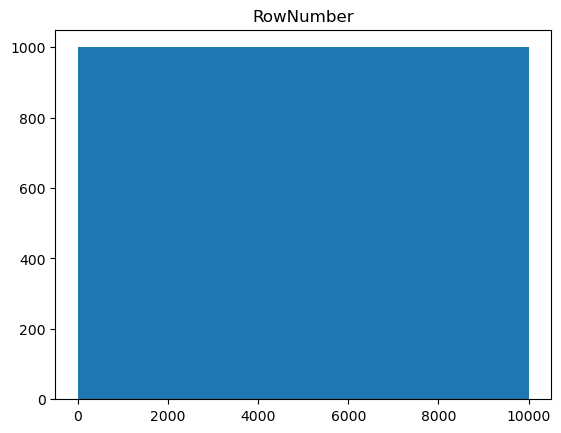

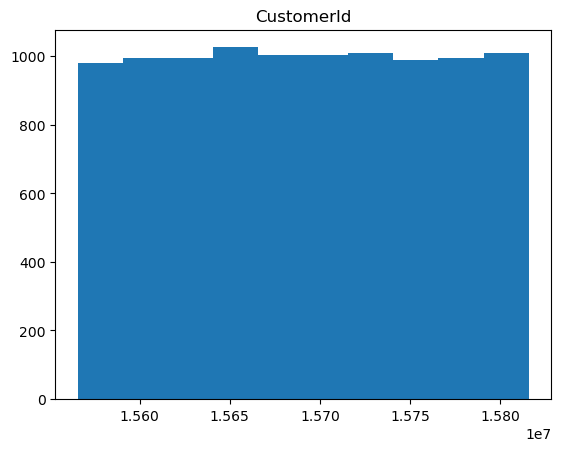

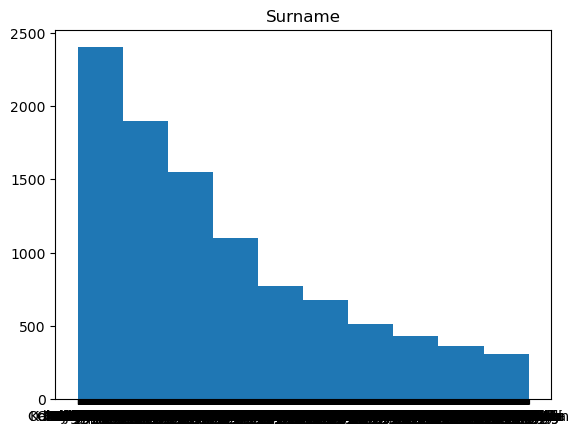

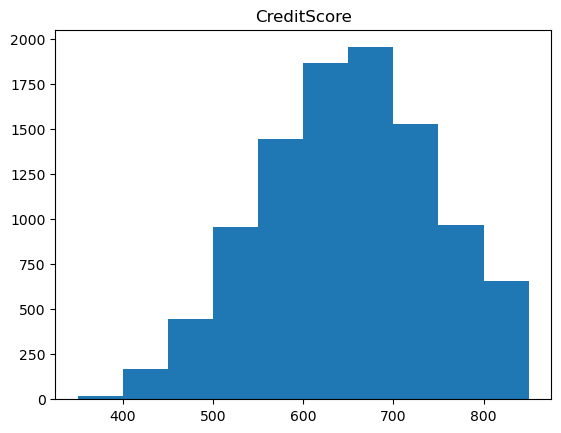

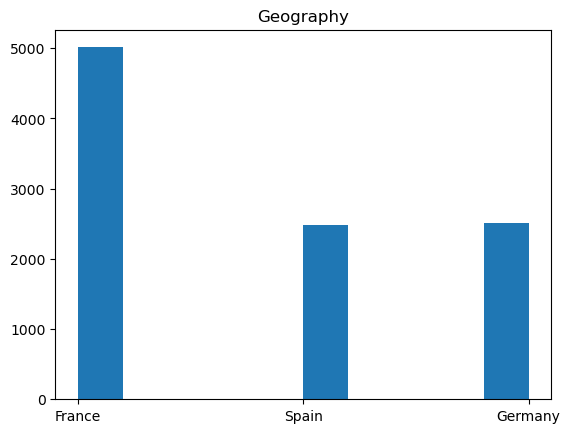

...

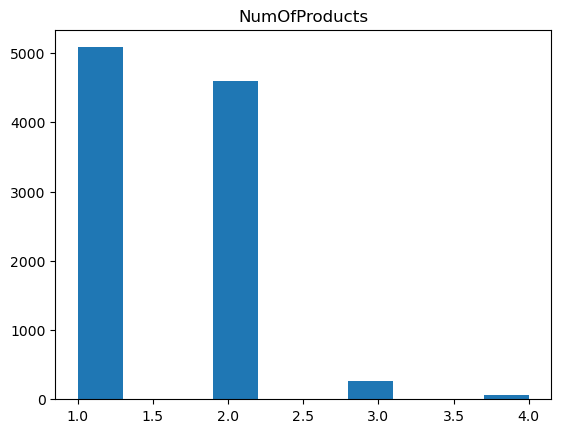

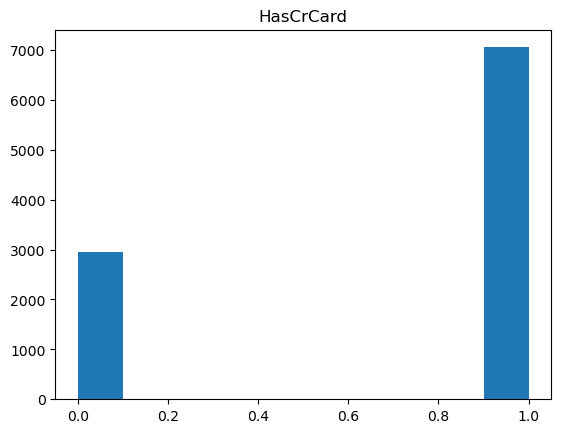

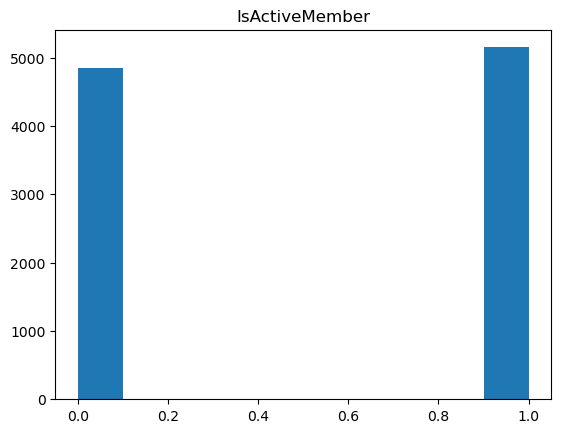

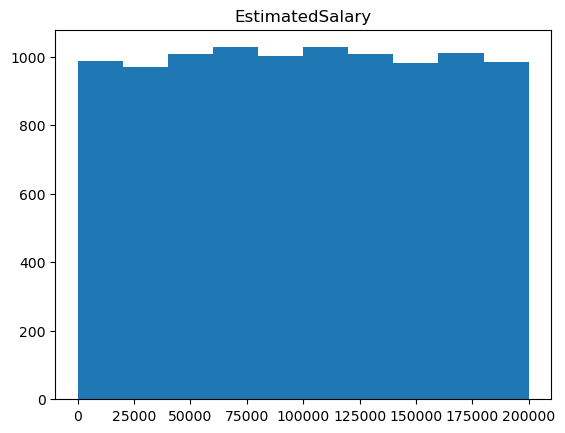

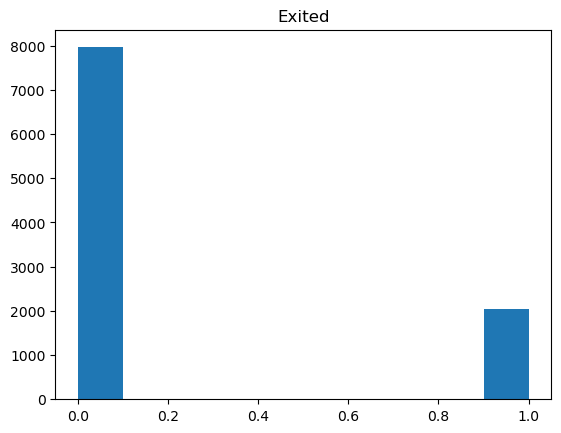

In [6]:
# Plot histograms for each variable
for col in df.columns:
    plt.hist(df[col])
    plt.title(col)
    plt.show()

<AxesSubplot:>

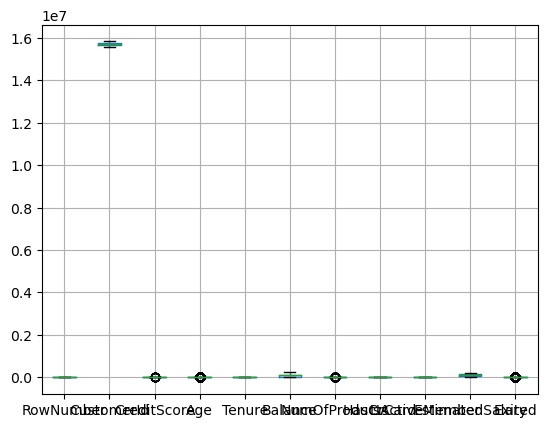

In [7]:
# Plot a boxplot for each column in the dataframe
df.boxplot()

In [8]:
# Summarize the data using statistical measures
print(df.describe())

         RowNumber    CustomerId   CreditScore           Age        Tenure  \
count  10000.00000  1.000000e+04  10000.000000  10000.000000  10000.000000   
mean    5000.50000  1.569094e+07    650.528800     38.921800      5.012800   
std     2886.89568  7.193619e+04     96.653299     10.487806      2.892174   
min        1.00000  1.556570e+07    350.000000     18.000000      0.000000   
25%     2500.75000  1.562853e+07    584.000000     32.000000      3.000000   
50%     5000.50000  1.569074e+07    652.000000     37.000000      5.000000   
75%     7500.25000  1.575323e+07    718.000000     44.000000      7.000000   
max    10000.00000  1.581569e+07    850.000000     92.000000     10.000000   

             Balance  NumOfProducts    HasCrCard  IsActiveMember  \
count   10000.000000   10000.000000  10000.00000    10000.000000   
mean    76485.889288       1.530200      0.70550        0.515100   
std     62397.405202       0.581654      0.45584        0.499797   
min         0.000000     

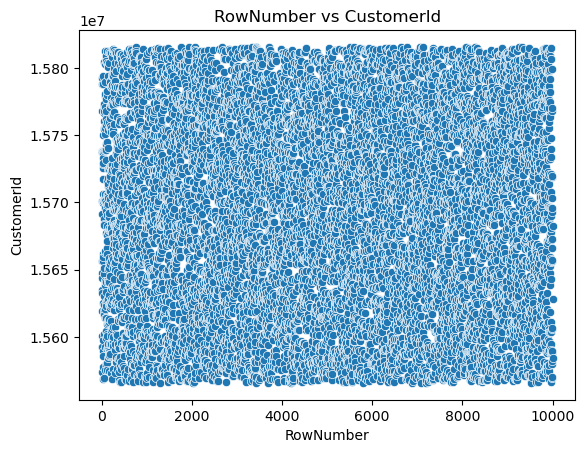

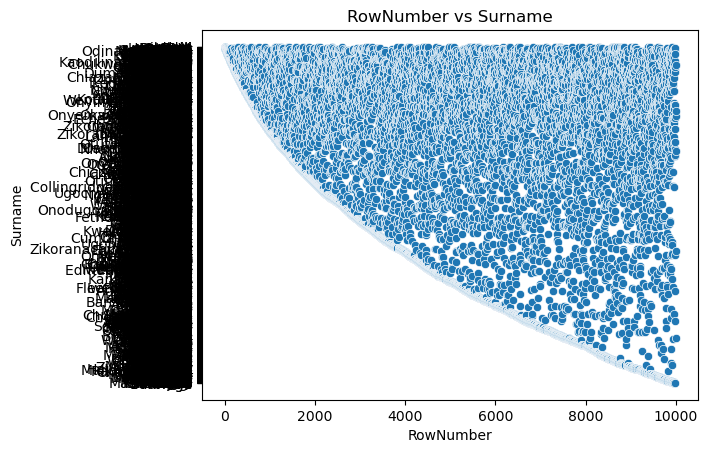

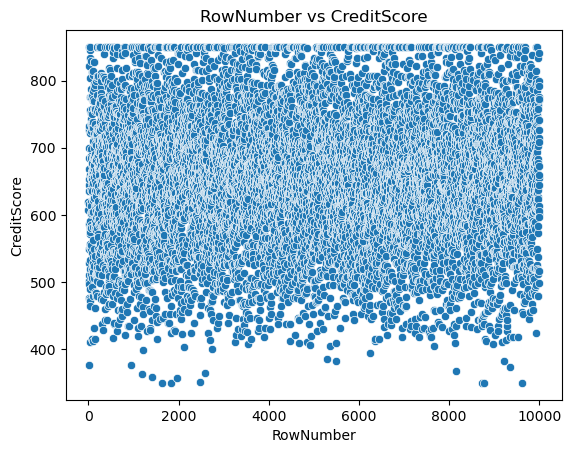

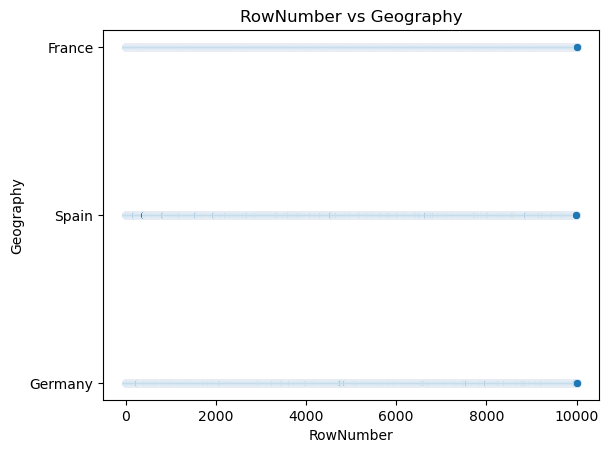

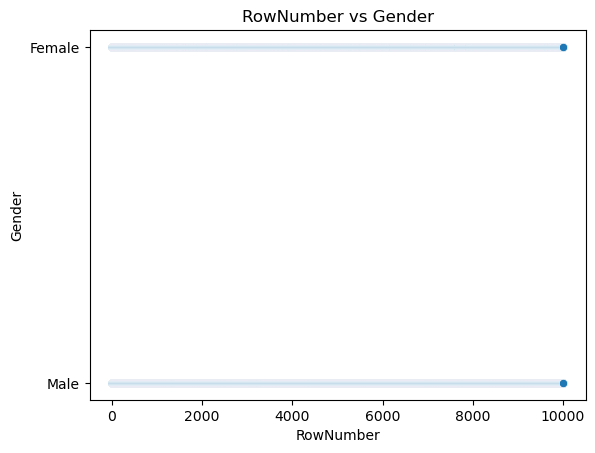

...

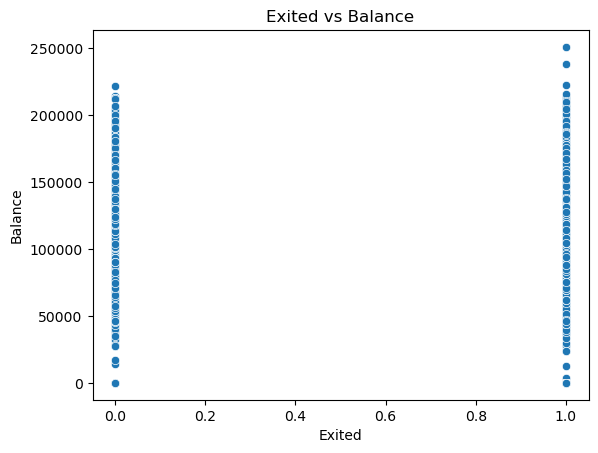

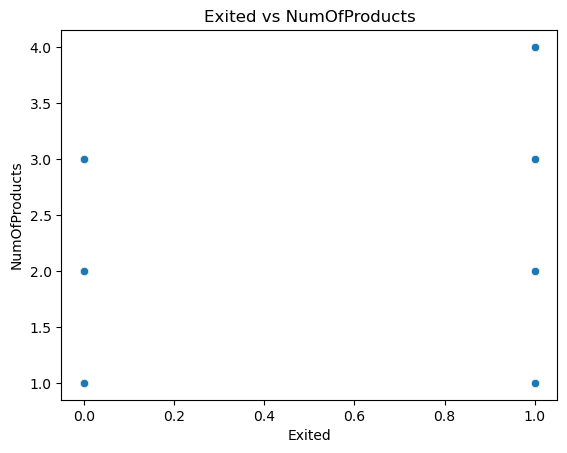

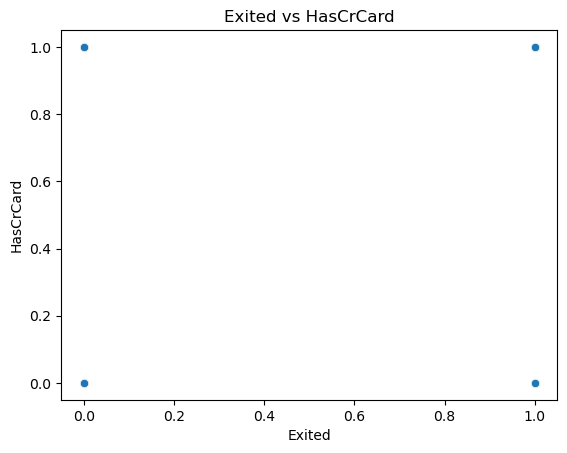

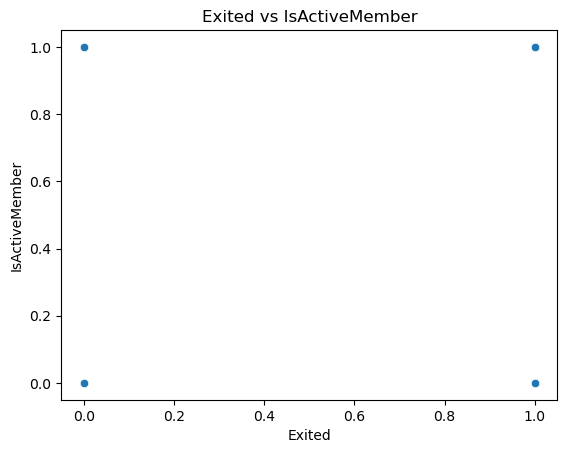

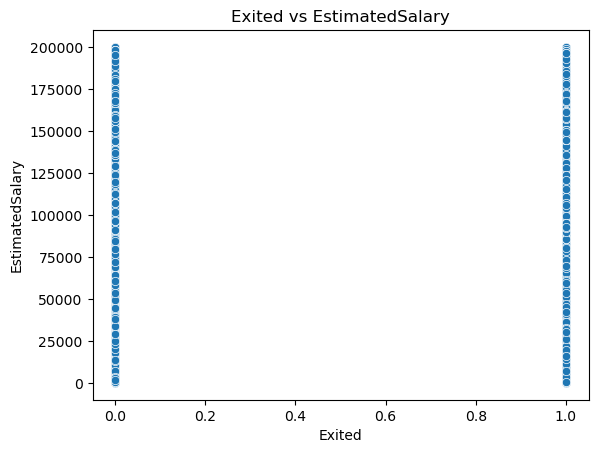

In [9]:
#bivariate analysis
# Plot scatter plots for each pair of variables
for col1 in df.columns:
    for col2 in df.columns:
        if col1 != col2:
            sns.scatterplot(x=df[col1], y=df[col2])
            plt.title(f"{col1} vs {col2}")
            plt.show()

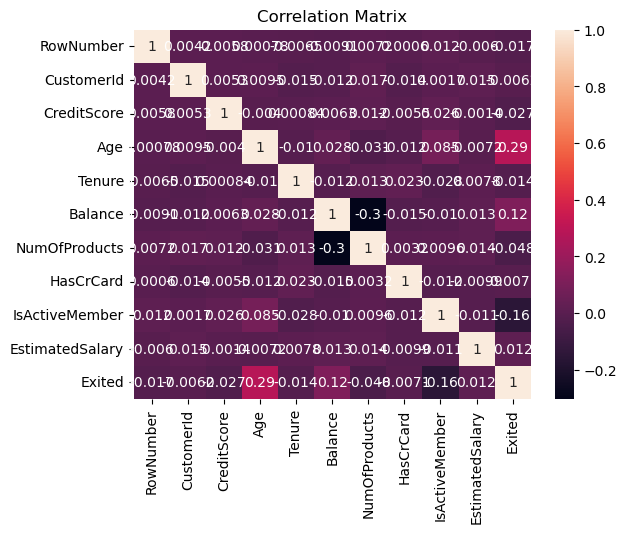

In [11]:
# Plot a correlation matrix
sns.heatmap(df.corr(), annot=True)
plt.title("Correlation Matrix")
plt.show()

In [12]:
#multivariate analysis
from sklearn.decomposition import PCA

In [13]:
from sklearn.preprocessing import LabelEncoder

# Find all the columns with string values in the data
string_columns = df.columns[df.dtypes == 'object']

# Encode the string values in each of the columns
for col in string_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

# Perform PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df)

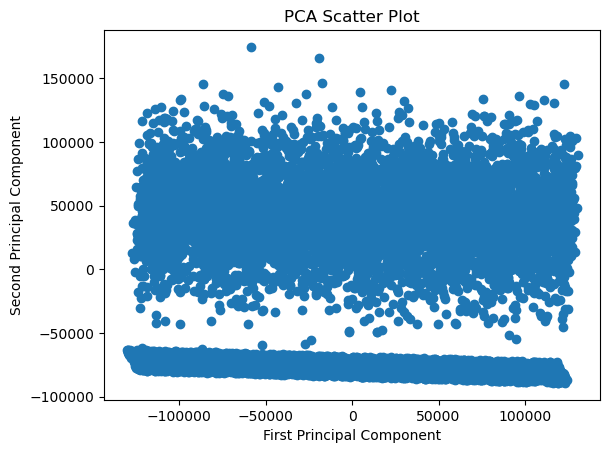

In [14]:
# Plot the scatter plot
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Scatter Plot')
plt.show()

In [18]:
# Split the dataset into features (X) and target (y)
X = df.drop("EstimatedSalary", axis=1)
y = df["EstimatedSalary"]


In [19]:
# One-hot encode the 'sex' column
X = pd.get_dummies(df.drop("EstimatedSalary", axis=1))
y = df["EstimatedSalary"]

In [20]:
# Train the linear regression model
reg = LinearRegression().fit(X, y)

In [22]:
# Predict using the trained model
y_pred = reg.predict(X)

In [23]:
# Evaluate the model using MAE, RMSE and MSE
mae = mean_absolute_error(y, y_pred)
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)

MAE: 49622.27984782252
MSE: 3302305434.244708
RMSE: 57465.68919141846
